In [1]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
plt.style.use('dark_background')
import tifffile as tiff
import numpy as np
import pandas as pd
import random
from PIL import Image

# Filttering Wrong photos in masks 

In [2]:
labels_path = 'data/labels'
images_path = 'data/images'
all_labels = os.listdir(labels_path)
filtered_labels = [label for label in all_labels if '_' not in label]

for label in all_labels:
    if '_' in label:
        os.remove(os.path.join(labels_path, label))

In [3]:
valid_labels = [label for label in filtered_labels if f"{label.replace('.png', '')}.tif" in os.listdir(images_path)]

In [4]:
print(len(filtered_labels))
print(len(valid_labels))

306
306


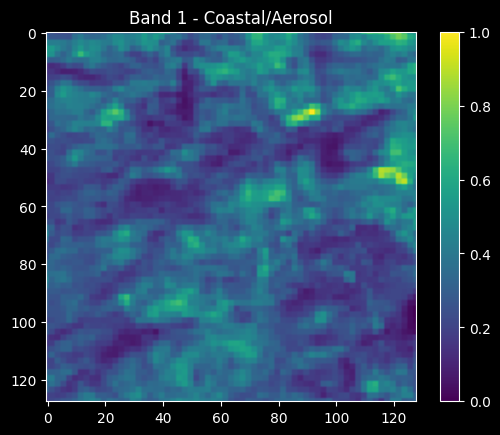

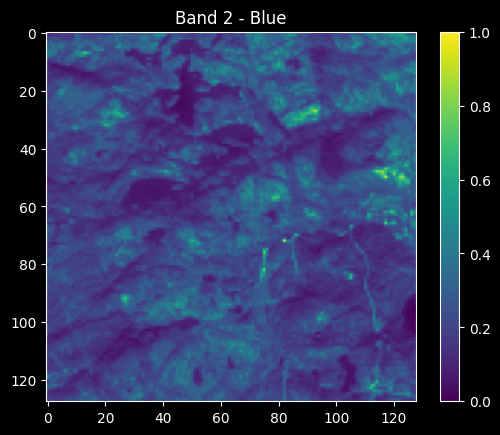

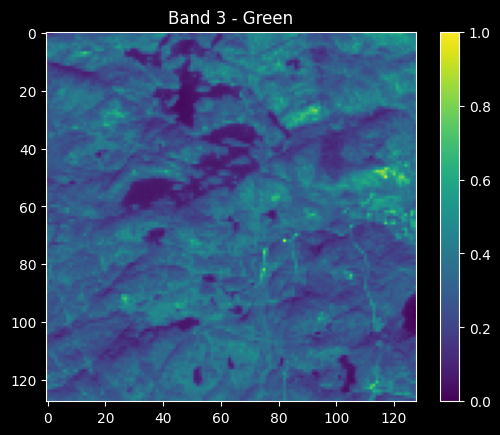

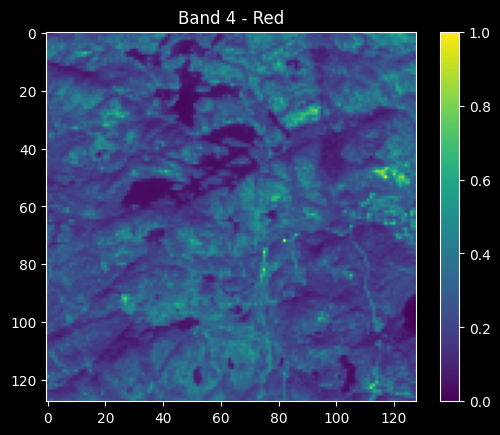

In [5]:
image_path = os.path.join(images_path, '0.tif')
image = tiff.imread(image_path)



# Normalize each channel to the range [0, 1] for visualization
def normalize_channel(channel):
    min_val = np.min(channel)
    max_val = np.max(channel)
    return (channel - min_val) / (max_val - min_val)

# Display specific bands
bands_to_display = {
    1: 'Coastal/Aerosol',
    2: 'Blue',
    3: 'Green',
    4: 'Red'
}

for band_index, band_name in bands_to_display.items():
    plt.figure()
    band = normalize_channel(image[:, :, band_index - 1])
    plt.imshow(band, cmap='viridis')  # Use a color map like 'viridis'
    plt.title(f'Band {band_index} - {band_name}')
    plt.colorbar()
    plt.show()

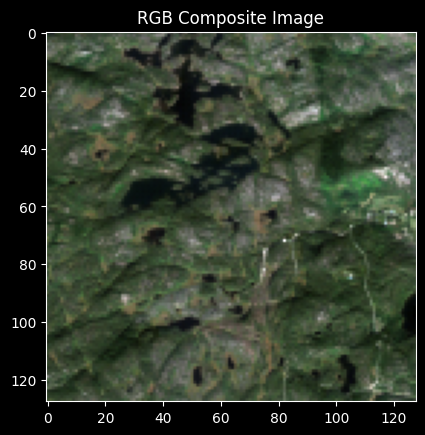

In [6]:
# Extract bands for RGB composite
red_band = normalize_channel(image[:, :, 3])  # Band 4 - Red
green_band = normalize_channel(image[:, :, 2])  # Band 3 - Green
blue_band = normalize_channel(image[:, :, 1])  # Band 2 - Blue

# Stack bands to form an RGB image
rgb_image = np.stack((red_band, green_band, blue_band), axis=-1)

plt.figure()
plt.imshow(rgb_image)
plt.title('RGB Composite Image')
plt.show()

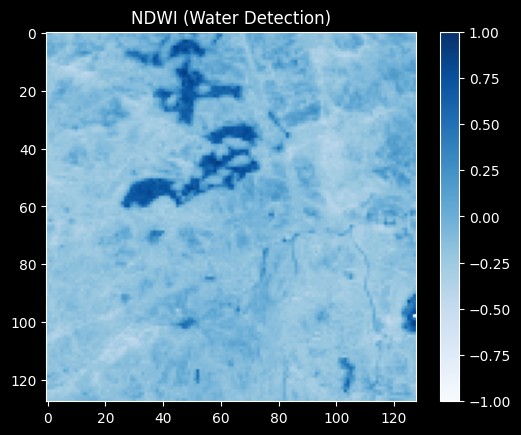

In [7]:
nir_band = normalize_channel(image[:, :, 4])  # Band 5 - NIR
green_band = normalize_channel(image[:, :, 2])  # Band 3 - Green

# Calculate NDWI
ndwi = (green_band - nir_band) / (green_band + nir_band)

plt.figure()
plt.imshow(ndwi, cmap='Blues')  # Blue colormap to highlight water
plt.title('NDWI (Water Detection)')
plt.colorbar()
plt.show()

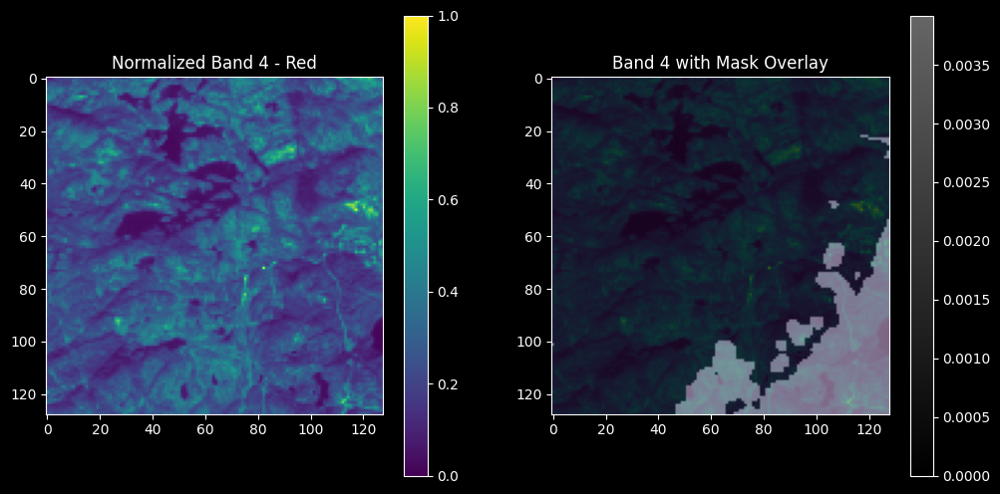

In [8]:
# Load the mask
mask_path = os.path.join(labels_path, '8.png')  # Adjust if needed
mask = plt.imread(mask_path)

# Display a specific band with mask overlay
plt.figure(figsize=(12, 6))

# Display normalized band
plt.subplot(1, 2, 1)
plt.imshow(normalize_channel(image[:, :, 3]), cmap='viridis')  # Example with Band 4 - Red
plt.title('Normalized Band 4 - Red')
plt.colorbar()

# Overlay mask on the band
plt.subplot(1, 2, 2)
plt.imshow(normalize_channel(image[:, :, 3]), cmap='viridis', alpha=0.6)
plt.imshow(mask, cmap='gray', alpha=0.4)  # Adjust alpha for transparency
plt.title('Band 4 with Mask Overlay')
plt.colorbar()

plt.show()

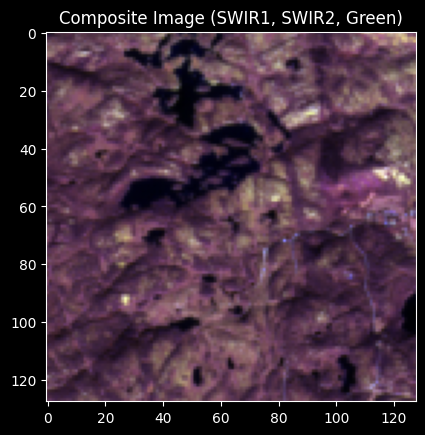

In [9]:
swir1_band = normalize_channel(image[:, :, 5])  # Example SWIR 1
swir2_band = normalize_channel(image[:, :, 6])  # Example SWIR 2

# Create composite
composite_image = np.stack((swir1_band, swir2_band, green_band), axis=-1)  # SWIR1, SWIR2, Green

plt.figure()
plt.imshow(composite_image)
plt.title('Composite Image (SWIR1, SWIR2, Green)')
plt.show()

# **_Visulize Random 10 Photos in compositte RGB and Ndwr_** 

C:\Users\salma.muhammad\AppData\Local\Temp\ipykernel_3088\1656973491.py:23: RuntimeWarning: invalid value encountered in divide
  ndwi = (green_band - nir_band) / (green_band + nir_band)


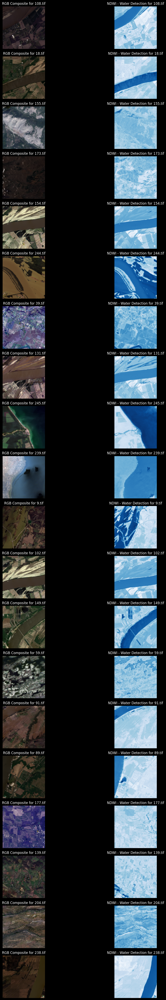

In [10]:
all_files = [f for f in os.listdir(images_path) if f.endswith('.tif')]
random_files = random.sample(all_files, 20)
def normalize_channel(channel):
    min_val = np.min(channel)
    max_val = np.max(channel)
    return (channel - min_val) / (max_val - min_val)
fig, axes = plt.subplots(20, 2, figsize=(15, 50))

for i, image_file in enumerate(random_files):
    image_path = os.path.join(images_path, image_file)
    image = tiff.imread(image_path)
    
    # Extract RGB (Blue = Band 2, Green = Band 3, Red = Band 4)
    blue_band = normalize_channel(image[:, :, 1])  # Band 2 - Blue
    green_band = normalize_channel(image[:, :, 2])  # Band 3 - Green
    red_band = normalize_channel(image[:, :, 3])  # Band 4 - Red
    rgb_composite = np.dstack((red_band, green_band, blue_band))
    
   
    nir_band = normalize_channel(image[:, :, 4])  # Band 5 - NIR

   
    ndwi = (green_band - nir_band) / (green_band + nir_band)
    
    
    axes[i, 0].imshow(rgb_composite)
    axes[i, 0].set_title(f'RGB Composite for {image_file}')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(ndwi, cmap='Blues')  # Blue colormap to highlight water
    axes[i, 1].set_title(f'NDWI - Water Detection for {image_file}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

# **_Visiulizing masks_**

C:\Users\salma.muhammad\AppData\Local\Temp\ipykernel_3088\334679207.py:42: RuntimeWarning: invalid value encountered in divide
  ndwi = (green_band - nir_band) / (green_band + nir_band)


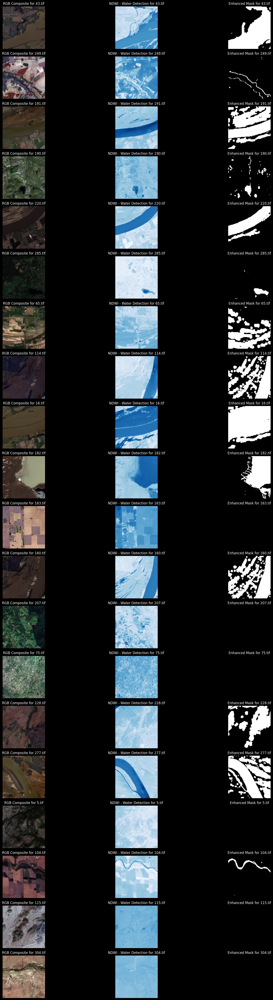

In [11]:
all_files = [f for f in os.listdir(images_path) if f.endswith('.tif')]
random_files = random.sample(all_files, 20)

def normalize_channel(channel):
    min_val = np.min(channel)
    max_val = np.max(channel)
    return (channel - min_val) / (max_val - min_val)

def enhance_mask(mask):
    # Convert the mask to a NumPy array
    mask_array = np.array(mask)
    
    # Multiply by a constant to enhance contrast
    enhanced_mask = mask_array * 255  # Assuming mask values are in [0, 1]
    enhanced_mask = np.clip(enhanced_mask, 0, 255)  # Ensure the values are within [0, 255]
    return enhanced_mask.astype(np.uint8)

fig, axes = plt.subplots(20, 3, figsize=(20, 50))

for i, image_file in enumerate(random_files):
    image_path = os.path.join(images_path, image_file)
    label_file = os.path.splitext(image_file)[0] + ".png"  # Assuming mask has the same name with .png extension
    label_path = os.path.join(labels_path, label_file)

    # Load image and mask
    image = tiff.imread(image_path)
    mask = Image.open(label_path)
    
    # Enhance the mask
    enhanced_mask = enhance_mask(mask)
    
    # Extract RGB (Blue = Band 2, Green = Band 3, Red = Band 4)
    blue_band = normalize_channel(image[:, :, 1])  # Band 2 - Blue
    green_band = normalize_channel(image[:, :, 2])  # Band 3 - Green
    red_band = normalize_channel(image[:, :, 3])  # Band 4 - Red

    # Create an RGB composite
    rgb_composite = np.dstack((red_band, green_band, blue_band))
    
    # Extract the NIR band and calculate NDWI
    nir_band = normalize_channel(image[:, :, 4])  # Band 5 - NIR
    ndwi = (green_band - nir_band) / (green_band + nir_band)
    
    # Display the RGB composite
    axes[i, 0].imshow(rgb_composite)
    axes[i, 0].set_title(f'RGB Composite for {image_file}')
    axes[i, 0].axis('off')
    
    # Display the NDWI
    axes[i, 1].imshow(ndwi, cmap='Blues')  # Blue colormap to highlight water
    axes[i, 1].set_title(f'NDWI - Water Detection for {image_file}')
    axes[i, 1].axis('off')
    
    # Display the enhanced mask
    axes[i, 2].imshow(enhanced_mask, cmap='gray')  # Grayscale colormap for masks
    axes[i, 2].set_title(f'Enhanced Mask for {image_file}')
    axes[i, 2].axis('off')

# Adjust layout to ensure everything fits
plt.tight_layout()
plt.show()

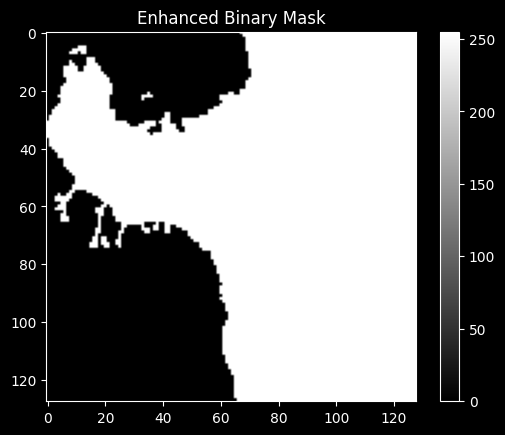

In [12]:
# Build the full path to the label image
label_path = os.path.join(labels_path, '11.png')

# Read the mask image
mask = cv.imread(label_path, cv.IMREAD_UNCHANGED)

# Optionally multiply the mask by 255 for better visualization
mask_enhanced = mask * 255

# Plot the enhanced mask
plt.figure()
plt.imshow(mask_enhanced, cmap='gray')  # Use 'gray' colormap
plt.title('Enhanced Binary Mask')
plt.colorbar()
plt.show()

# **_Reading Images and Masks_**

In [13]:
image_files = [f for f in os.listdir(images_path) if f.endswith('.tif')]

images = []
masks = []

for image_file in image_files:
  
    image_path = os.path.join(images_path, image_file)
    label_file = os.path.splitext(image_file)[0] + ".png"  
    label_path = os.path.join(labels_path, label_file)

    image = tiff.imread(image_path)
    mask = Image.open(label_path)
    
    mask = np.array(mask)

    mask = (mask > 0).astype(np.uint8)
    
    images.append(image)
    masks.append(mask)

# Convert lists to numpy arrays
images = np.array(images)
masks = np.array(masks)

# Check the shapes of the loaded images and masks
print(f'Loaded {len(images)} images with shape {images.shape}')
print(f'Loaded {len(masks)} masks with shape {masks.shape}')

Loaded 306 images with shape (306, 128, 128, 12)
Loaded 306 masks with shape (306, 128, 128)


channel min:84
channel max:2591
channel min:316
channel max:3151
channel min:244
channel max:3416
done
[[1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
channel min:-31
channel max:2933
channel min:227
channel max:3623
channel min:186
channel max:4115
done
[[0 0 0 ... 0 1 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
channel min:128
channel max:2664
channel min:287
channel max:3144
channel min:259
channel max:3378
done
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
channel min:-159
channel max:3405
channel min:11
channel max:3504
channel min:-69
channel max:3426
done
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 1 0]
 [0 0 0 ... 1 1 0]]
channel min:93
channel max:2689
channel min:316
channel max:3151
channel min:244
channel max:3416
done
[[

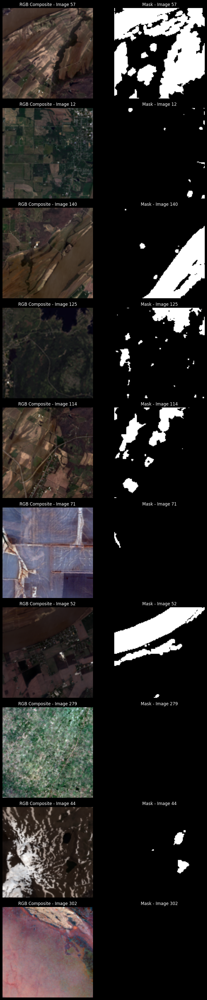

In [14]:
def normalize_channel(channel):
    min_val = np.min(channel)
    max_val = np.max(channel)
    print(f"channel min:{min_val}")
    print(f"channel max:{max_val}")
    return (channel - min_val) / (max_val - min_val)

# Ensure random selection is reproducible
random.seed(42)

# Randomly select 10 images and masks
indices = random.sample(range(len(images)), 10)

# Plot the selected images and masks
fig, axes = plt.subplots(10, 2, figsize=(10, 40))

for i, idx in enumerate(indices):
    # Get the image and corresponding mask
    image = images[idx]
    mask = masks[idx]
    
    # Extract RGB channels (Blue = Band 2, Green = Band 3, Red = Band 4)
    blue_band = normalize_channel(image[:, :, 1])  # Band 2 - Blue
    green_band = normalize_channel(image[:, :, 2])  # Band 3 - Green
    red_band = normalize_channel(image[:, :, 3])  # Band 4 - Red
    print("done")
    # Stack RGB channels
    rgb_composite = np.dstack((red_band, green_band, blue_band))
    
    # Plot the RGB composite
    axes[i, 0].imshow(rgb_composite)
    axes[i, 0].set_title(f'RGB Composite - Image {idx}')
    axes[i, 0].axis('off')
    
    # Plot the corresponding mask
    axes[i, 1].imshow(mask, cmap='gray')
    print(mask)
    axes[i, 1].set_title(f'Mask - Image {idx}')
    axes[i, 1].axis('off')

# Adjust layout to ensure proper spacing
plt.tight_layout()
plt.show()

# **_Normalizing each color band_** 

In [59]:
# def normalize_image(image):
#     norm_img = np.zeros_like(image, dtype=np.float32)
#     for b in range(image.shape[2]): 
#         band = image[:, :, b]
#         min_val = np.min(band)
#         max_val = np.max(band)
#         norm_img[:, :, b] = (band - min_val) / (max_val - min_val)
#     return norm_img
def normalize_image(image):
    norm_img = np.zeros_like(image, dtype=np.float32)
    for b in range(image.shape[2]):
        band = image[:, :, b]
        min_val = np.min(band)
        max_val = np.max(band)
        if max_val != min_val:
            norm_img[:, :, b] = (band - min_val) / (max_val - min_val)
        else:
            norm_img[:, :, b] = 0  # or any constant value
    return norm_img

# def normalize_image(image):
#         min_val = np.min(band)
#         max_val = np.max(band)
#         norm_img= (image - min_val) / (max_val - min_val)

#         return norm_img

In [60]:
images_normalized = np.array([normalize_image(img) for img in images])

done
[[1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
done
[[0 0 0 ... 0 1 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]
done
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
done
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 1 0]
 [0 0 0 ... 1 1 0]]
done
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [1 1 1 ... 0 0 0]]


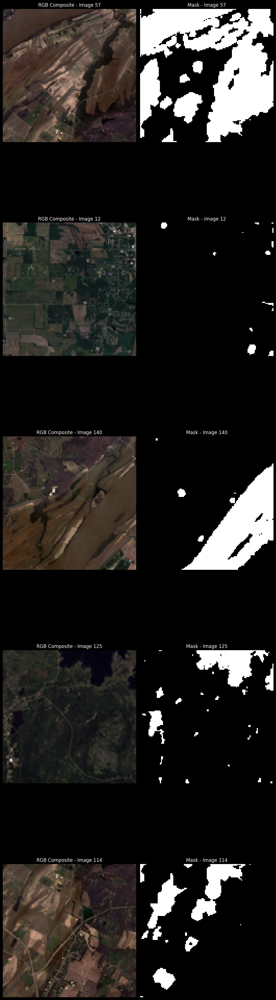

In [61]:
random.seed(42)

# Randomly select 10 images and masks
indices = random.sample(range(len(images_normalized)), 5)

# Plot the selected images and masks
fig, axes = plt.subplots(5, 2, figsize=(10, 40))

for i, idx in enumerate(indices):
    # Get the image and corresponding mask
    image = images_normalized[idx]
    mask = masks[idx]
    
    # Extract RGB channels (Blue = Band 2, Green = Band 3, Red = Band 4)
    blue_band = image[:, :, 1]  # Band 2 - Blue
    green_band = image[:, :, 2] # Band 3 - Green
    red_band = image[:, :, 3]  # Band 4 - Red
    print("done")
    # Stack RGB channels
    rgb_composite = np.dstack((red_band, green_band, blue_band))
    
    # Plot the RGB composite
    axes[i, 0].imshow(rgb_composite)
    axes[i, 0].set_title(f'RGB Composite - Image {idx}')
    axes[i, 0].axis('off')
    
    # Plot the corresponding mask
    axes[i, 1].imshow(mask, cmap='gray')
    print(mask)
    axes[i, 1].set_title(f'Mask - Image {idx}')
    axes[i, 1].axis('off')

# Adjust layout to ensure proper spacing
plt.tight_layout()
plt.show()

# **_Splitting our Dataset_**

In [62]:
from sklearn.model_selection import train_test_split
X_train_val, X_test, y_train_val, y_test = train_test_split(images_normalized, masks, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.3, random_state=42)

In [63]:
print(f"Train_x:{len(X_train)}")
print(f"Train_y:{len(y_train)}")
print(f"Val_x:{len(X_val)}")
print(f"Val_y:{len(y_val)}")
print(f"Test_x:{len(X_test)}")
print(f"Test_y:{len(y_test)}")

Train_x:170
Train_y:170
Val_x:74
Val_y:74
Test_x:62
Test_y:62


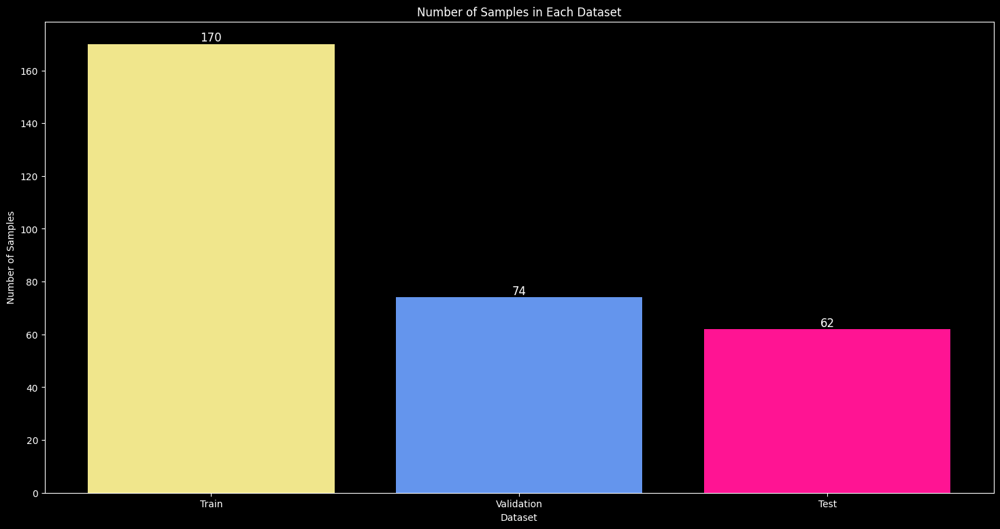

In [64]:
train_len = len(X_train)
val_len = len(X_val)
test_len = len(X_test)

labels = ['Train', 'Validation', 'Test']
image_counts = [train_len, val_len, test_len]

plt.figure(figsize=(18, 9))
bars = plt.bar(labels, image_counts, color=['#f0e68c', '#6495ed', '#ff1493'])

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center', fontsize=12)

plt.xlabel('Dataset')
plt.ylabel('Number of Samples')
plt.title('Number of Samples in Each Dataset')
plt.show()

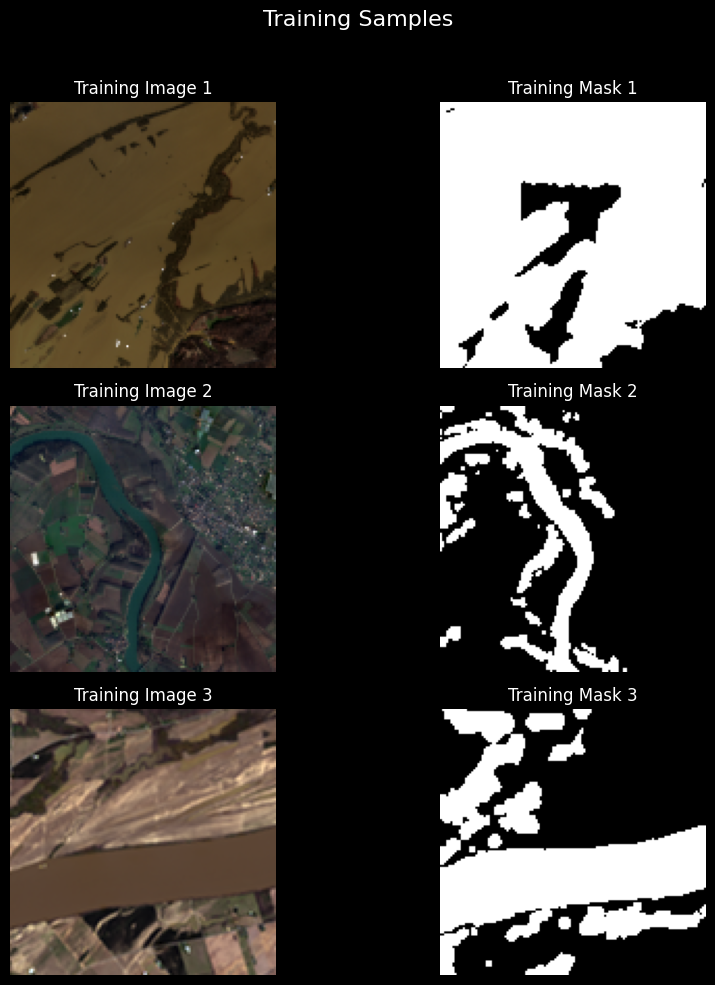

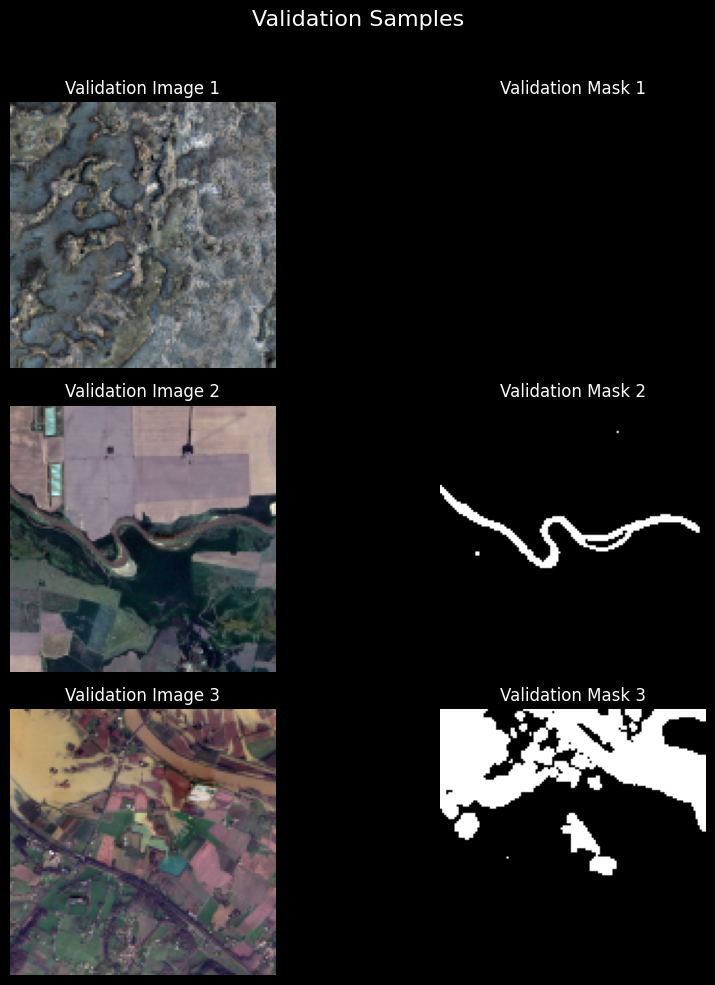

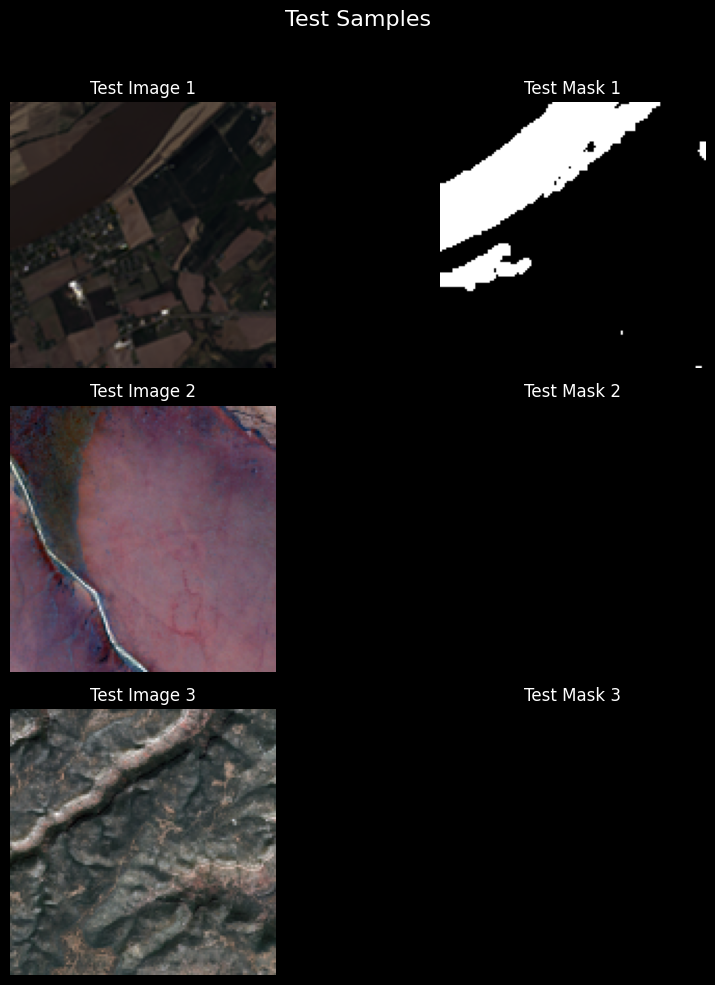

In [65]:
num_samples = 3

def plot_samples(X, y, dataset_name):
    indices = random.sample(range(len(X)), num_samples)
    
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 10))
    fig.suptitle(f'{dataset_name} Samples', fontsize=16)
    
    for i, idx in enumerate(indices):
     
        img = X[idx]
        mask = y[idx]
        red_band = img[:, :, 3]  # Band 3 - Red
        green_band = img[:, :, 2]  # Band 2 - Green
        blue_band = img[:, :, 1]  # Band 1 - Blue
        rgb_composite = np.stack([red_band, green_band, blue_band], axis=-1)        
             
        axes[i, 0].imshow(rgb_composite)
        axes[i, 0].set_title(f'{dataset_name} Image {i+1}')
        axes[i, 0].axis('off')
        
      
        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title(f'{dataset_name} Mask {i+1}')
        axes[i, 1].axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Plot 3 random samples from each dataset
plot_samples(X_train, y_train, 'Training')
plot_samples(X_val, y_val, 'Validation')
plot_samples(X_test, y_test, 'Test')


# **_Augmentaing Dataset_**

In [66]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=30,
    brightness_range=[0.8, 1.2]
)

val_datagen = ImageDataGenerator()

train_generator = train_datagen.flow(X_train, y_train, batch_size=32, shuffle=True)
val_generator = val_datagen.flow(X_val, y_val, batch_size=32, shuffle=False)


c:\Users\salma.muhammad\anaconda3\Lib\site-packages\keras\src\legacy\preprocessing\image.py:619: UserWarning: NumpyArrayIterator is set to use the data format convention "channels_last" (channels on axis 3), i.e. expected either 1, 3, or 4 channels on axis 3. However, it was passed an array with shape (170, 128, 128, 12) (12 channels).
  warnings.warn(
c:\Users\salma.muhammad\anaconda3\Lib\site-packages\keras\src\legacy\preprocessing\image.py:619: UserWarning: NumpyArrayIterator is set to use the data format convention "channels_last" (channels on axis 3), i.e. expected either 1, 3, or 4 channels on axis 3. However, it was passed an array with shape (74, 128, 128, 12) (12 channels).
  warnings.warn(


In [67]:
X_train[0]

array([[[0.5245184 , 0.42166108, 0.2394958 , ..., 0.1632653 ,
         0.42857143, 0.        ],
        [0.52305895, 0.42744145, 0.2647059 , ..., 0.14285715,
         0.42857143, 0.        ],
        [0.49065965, 0.39062977, 0.21358544, ..., 0.14285715,
         0.42857143, 0.        ],
        ...,
        [0.51255107, 0.3954974 , 0.21533613, ..., 0.12244898,
         0.42857143, 0.        ],
        [0.5037945 , 0.38637054, 0.19922969, ..., 0.14285715,
         0.42857143, 0.        ],
        [0.50583774, 0.386979  , 0.20238096, ..., 0.14285715,
         0.2857143 , 0.        ]],

       [[0.54319906, 0.43535137, 0.23004201, ..., 0.18367347,
         0.        , 0.        ],
        [0.5344425 , 0.43078795, 0.24859944, ..., 0.1632653 ,
         0.42857143, 0.        ],
        [0.5183888 , 0.422878  , 0.2692577 , ..., 0.14285715,
         0.42857143, 0.        ],
        ...,
        [0.5391127 , 0.42652875, 0.23774509, ..., 0.14285715,
         0.2857143 , 0.        ],
        [0.5

In [68]:
print(np.isnan(X_train).sum(), np.isinf(X_train).sum())
print(np.isnan(y_train).sum(), np.isinf(y_train).sum())
print(np.isnan(X_val).sum(), np.isinf(X_val).sum())
print(np.isnan(y_val).sum(), np.isinf(y_val).sum())

0 0
0 0
0 0
0 0


In [69]:
print(np.isnan(images).sum(), np.isinf(images).sum())
print(np.isnan(masks).sum(), np.isinf(masks).sum())
print(np.isnan(images_normalized).sum(), np.isinf(images_normalized).sum())

0 0
0 0
0 0


In [70]:
nan_indices_X_train = np.where(np.isnan(X_train))
nan_indices_y_train = np.where(np.isnan(y_train))
nan_indices_X_train

(array([], dtype=int64),
 array([], dtype=int64),
 array([], dtype=int64),
 array([], dtype=int64))

In [71]:
print("Shape of X_train[0]:", X_train[0].shape)
print("Shape of y_train[0]:", y_train[0].shape)
print("Shape of X_val[0]:", X_val[0].shape)
print("Shape of y_val[0]:", y_val[0].shape)

Shape of X_train[0]: (128, 128, 12)
Shape of y_train[0]: (128, 128)
Shape of X_val[0]: (128, 128, 12)
Shape of y_val[0]: (128, 128)


# **_Modelling part_**

In [28]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization
from tensorflow.keras.optimizers import Adam

def unet_model(input_size=(128, 128, 12)):
    inputs = Input(input_size)
    
    # Encoder
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = BatchNormalization()(c1)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = BatchNormalization()(c2)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = BatchNormalization()(c3)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    
    # Bottleneck
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = BatchNormalization()(c4)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    c4 = BatchNormalization()(c4)
    
    # Decoder
    u5 = UpSampling2D((2, 2))(c4)
    u5 = concatenate([u5, c3])
    c5 = Conv2D(256, (3, 3), activation='relu', padding='same')(u5)
    c5 = BatchNormalization()(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', padding='same')(c5)
    c5 = BatchNormalization()(c5)
    
    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c2])
    c6 = Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
    c6 = BatchNormalization()(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', padding='same')(c6)
    c6 = BatchNormalization()(c6)
    
    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c1])
    c7 = Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
    c7 = BatchNormalization()(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', padding='same')(c7)
    c7 = BatchNormalization()(c7)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c7)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=Adam(learning_rate=1e-4, clipnorm=1.0), loss='binary_crossentropy', metrics=['accuracy'])
    return model

model = unet_model(input_size=(128, 128, 12))

history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=5,
    batch_size=32
)


Epoch 1/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 71s 9s/step - accuracy: 0.6616 - loss: 0.6653 - val_accuracy: 0.7999 - val_loss: 0.6657
Epoch 2/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 66s 9s/step - accuracy: 0.8742 - loss: 0.3333 - val_accuracy: 0.7919 - val_loss: 0.6364
Epoch 3/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 62s 9s/step - accuracy: 0.8860 - loss: 0.2913 - val_accuracy: 0.7919 - val_loss: 0.6111
Epoch 4/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 65s 9s/step - accuracy: 0.9062 - loss: 0.2560 - val_accuracy: 0.7919 - val_loss: 0.5845
Epoch 5/5
7/7 ━━━━━━━━━━━━━━━━━━━━ 61s 9s/step - accuracy: 0.9055 - loss: 0.2501 - val_accuracy: 0.7919 - val_loss: 0.5552


**_Second normalization_**

In [43]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization
from tensorflow.keras.optimizers import Adam

def unet_model(input_size=(128, 128, 12)):
    inputs = Input(input_size)
    
    # Encoder
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = BatchNormalization()(c1)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = BatchNormalization()(c2)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = BatchNormalization()(c3)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    
    # Bottleneck
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = BatchNormalization()(c4)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    c4 = BatchNormalization()(c4)
    
    # Decoder
    u5 = UpSampling2D((2, 2))(c4)
    u5 = concatenate([u5, c3])
    c5 = Conv2D(256, (3, 3), activation='relu', padding='same')(u5)
    c5 = BatchNormalization()(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', padding='same')(c5)
    c5 = BatchNormalization()(c5)
    
    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c2])
    c6 = Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
    c6 = BatchNormalization()(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', padding='same')(c6)
    c6 = BatchNormalization()(c6)
    
    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c1])
    c7 = Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
    c7 = BatchNormalization()(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', padding='same')(c7)
    c7 = BatchNormalization()(c7)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c7)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=Adam(learning_rate=1e-4, clipnorm=1.0), loss='binary_crossentropy', metrics=['accuracy'])
    return model

model = unet_model(input_size=(128, 128, 12))

history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=30,
    batch_size=32
)


Epoch 1/30
7/7 ━━━━━━━━━━━━━━━━━━━━ 75s 9s/step - accuracy: 0.6879 - loss: 0.6187 - val_accuracy: 0.4833 - val_loss: 0.6995
Epoch 2/30
7/7 ━━━━━━━━━━━━━━━━━━━━ 63s 9s/step - accuracy: 0.8687 - loss: 0.3639 - val_accuracy: 0.8083 - val_loss: 0.5016
Epoch 3/30
7/7 ━━━━━━━━━━━━━━━━━━━━ 64s 9s/step - accuracy: 0.8983 - loss: 0.2913 - val_accuracy: 0.8268 - val_loss: 0.5211
Epoch 4/30
7/7 ━━━━━━━━━━━━━━━━━━━━ 64s 9s/step - accuracy: 0.8994 - loss: 0.2793 - val_accuracy: 0.8789 - val_loss: 0.4367
Epoch 5/30
7/7 ━━━━━━━━━━━━━━━━━━━━ 66s 9s/step - accuracy: 0.9017 - loss: 0.2658 - val_accuracy: 0.8900 - val_loss: 0.3890
Epoch 6/30
7/7 ━━━━━━━━━━━━━━━━━━━━ 61s 9s/step - accuracy: 0.9073 - loss: 0.2523 - val_accuracy: 0.8976 - val_loss: 0.3848
Epoch 7/30
7/7 ━━━━━━━━━━━━━━━━━━━━ 62s 9s/step - accuracy: 0.9127 - loss: 0.2353 - val_accuracy: 0.9009 - val_loss: 0.3429
Epoch 8/30
7/7 ━━━━━━━━━━━━━━━━━━━━ 62s 9s/step - accuracy: 0.9124 - loss: 0.2322 - val_accuracy: 0.9019 - val_loss: 0.3250
Epoch 9/

In [44]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9227 - loss: 0.1964
Test Loss: 0.1971
Test Accuracy: 0.9238


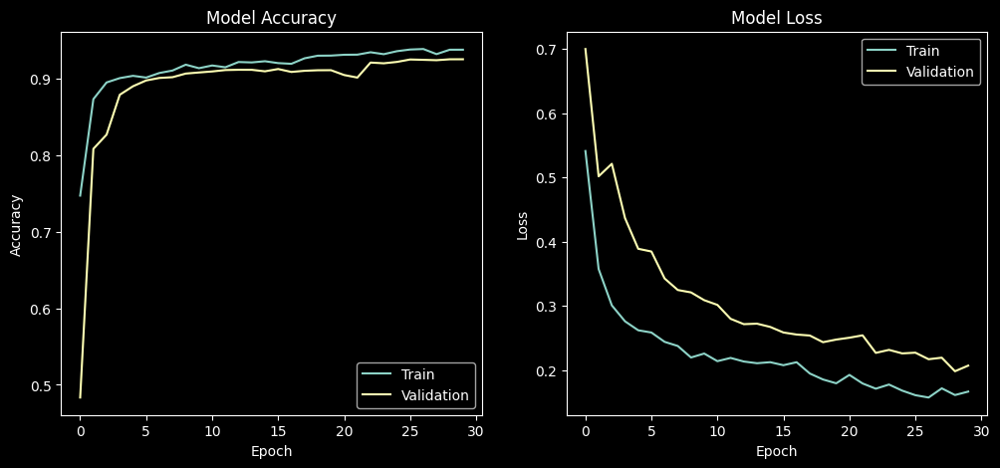

In [45]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])

plt.show()

In [50]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization
from tensorflow.keras.optimizers import Adam

def unet_model(input_size=(128, 128, 12)):
    inputs = Input(input_size)
    
    # Encoder
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = BatchNormalization()(c1)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = BatchNormalization()(c2)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = BatchNormalization()(c3)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    
    # Bottleneck
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = BatchNormalization()(c4)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    c4 = BatchNormalization()(c4)
    
    # Decoder
    u5 = UpSampling2D((2, 2))(c4)
    u5 = concatenate([u5, c3])
    c5 = Conv2D(256, (3, 3), activation='relu', padding='same')(u5)
    c5 = BatchNormalization()(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', padding='same')(c5)
    c5 = BatchNormalization()(c5)
    
    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c2])
    c6 = Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
    c6 = BatchNormalization()(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', padding='same')(c6)
    c6 = BatchNormalization()(c6)
    
    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c1])
    c7 = Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
    c7 = BatchNormalization()(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', padding='same')(c7)
    c7 = BatchNormalization()(c7)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c7)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=Adam(learning_rate=1e-4, clipnorm=1.0), loss='binary_crossentropy', metrics=['accuracy'])
    return model

model = unet_model(input_size=(128, 128, 12))
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define early stopping and model checkpoint callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping]
)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 62s 9s/step - accuracy: 0.5757 - loss: 0.7828 - val_accuracy: 0.8169 - val_loss: 0.4118
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 55s 9s/step - accuracy: 0.8326 - loss: 0.4025 - val_accuracy: 0.8713 - val_loss: 0.3273
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 55s 9s/step - accuracy: 0.8778 - loss: 0.3284 - val_accuracy: 0.8901 - val_loss: 0.3014
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 55s 9s/step - accuracy: 0.8877 - loss: 0.2907 - val_accuracy: 0.8922 - val_loss: 0.2968
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 55s 9s/step - accuracy: 0.8920 - loss: 0.2984 - val_accuracy: 0.9036 - val_loss: 0.2871
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 55s 9s/step - accuracy: 0.9026 - loss: 0.2653 - val_accuracy: 0.9099 - val_loss: 0.2826
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 55s 9s/step - accuracy: 0.9102 - loss: 0.2425 - val_accuracy: 0.9126 - val_loss: 0.2800
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 57s 9s/step - accuracy: 0.9122 - loss: 0.2285 - val_accuracy: 0.9138 - val_loss: 0.2752
Epoch 9/

In [52]:
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_69 (Conv2D)  │ (None, 128, 128,  │      6,976 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_69[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_70 (Conv2D)  │ (None, 128, 128,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_70[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_15    │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_71 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_15… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_71[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_72 (Conv2D)  │ (None, 64, 64,    │    147,584 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_72[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_73 (Conv2D)  │ (None, 32, 32,    │    295,168 │ max_pooling2d_16… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_73[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_74 (Conv2D)  │ (None, 32, 32,    │    590,080 │ batch_normalizat… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_74[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_17    │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_75 (Conv2D)  │ (None, 16, 16,    │  1,180,160 │ max_pooling2d_17

 Total params: 23,386,821 (89.21 MB)

 Trainable params: 7,793,729 (29.73 MB)

 Non-trainable params: 5,632 (22.00 KB)

 Optimizer params: 15,587,460 (59.46 MB)

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 3s/step - accuracy: 0.9409 - loss: 0.1574
Test Loss: 0.1608
Test Accuracy: 0.9393


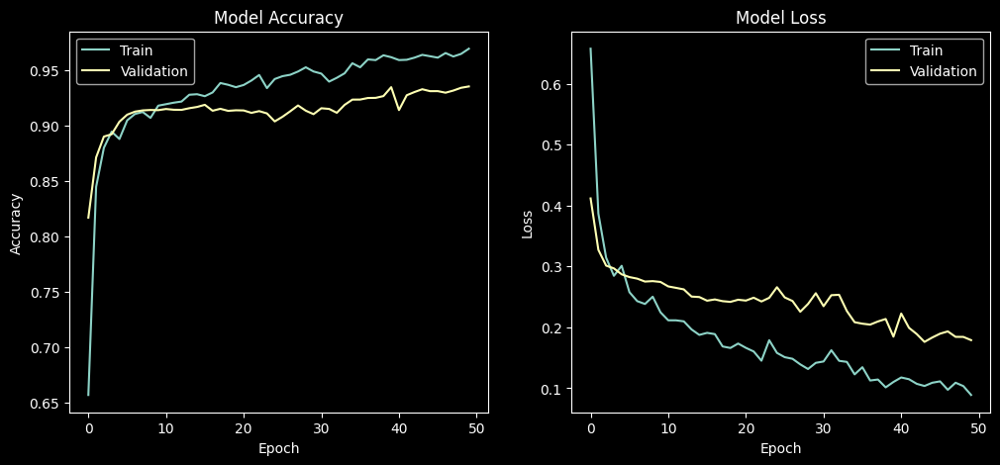

In [51]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])

plt.show()

1/2 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/stepWARNING:tensorflow:6 out of the last 8 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000002240A2204A0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 3s/step
Predictions shape: (62, 128, 128, 1)
Ground truth shape: (62, 128, 128)
F1 Score (weighted): 0.9377
Precision (weighted): 0.9387
Recall (weighted): 0.9393


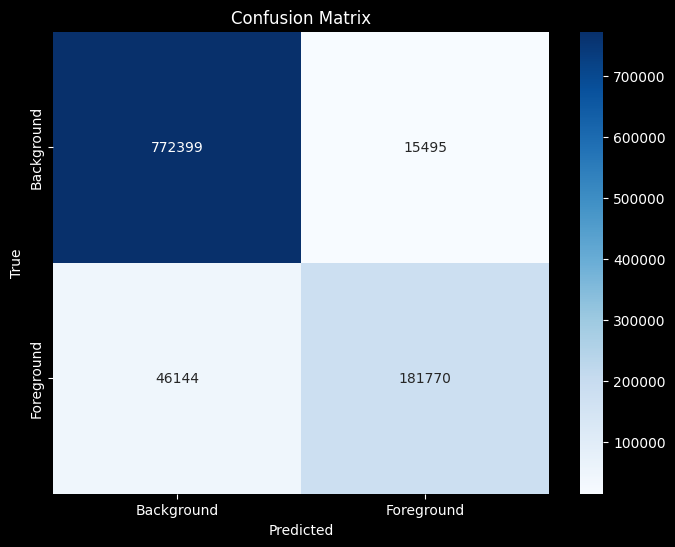

IoU Score: 0.7468


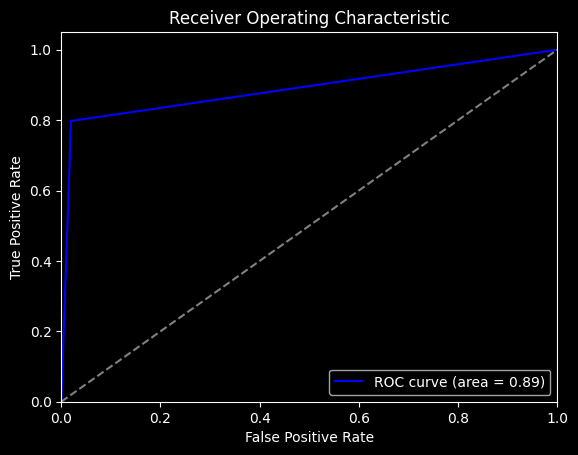

AUC: 0.8889
Dice Coefficient: 0.8550
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 4s/step - accuracy: 0.9409 - loss: 0.1574
Test Loss: 0.1608
Test Accuracy: 0.9393


In [53]:
def evalutee(model):
    y_pred = model.predict(X_test)
    print("Predictions shape:", y_pred.shape)
    print("Ground truth shape:", y_test.shape)

    # Convert predictions to binary
    y_pred_binary = (y_pred > 0.5).astype(np.uint8)

    # Flatten arrays for metric calculation
    y_test_flat = y_test.flatten()
    y_pred_flat = y_pred_binary.flatten()

    # Compute metrics for binary classification
    f1 = f1_score(y_test_flat, y_pred_flat, average='weighted')
    precision = precision_score(y_test_flat, y_pred_flat, average='weighted')
    recall = recall_score(y_test_flat, y_pred_flat, average='weighted')

    print(f"F1 Score (weighted): {f1:.4f}")
    print(f"Precision (weighted): {precision:.4f}")
    print(f"Recall (weighted): {recall:.4f}")

    # Calculate the confusion matrix
    conf_matrix = confusion_matrix(y_test_flat, y_pred_flat)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Background', 'Foreground'], 
                yticklabels=['Background', 'Foreground'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    # Compute IoU Score
    def compute_iou(y_true, y_pred):
        intersection = np.logical_and(y_true, y_pred)
        union = np.logical_or(y_true, y_pred)
        return np.sum(intersection) / np.sum(union)

    iou_score = compute_iou(y_test_flat, y_pred_flat)
    print(f"IoU Score: {iou_score:.4f}")

    # Compute ROC Curve and AUC
    fpr, tpr, _ = roc_curve(y_test_flat, y_pred_flat)
    auc = roc_auc_score(y_test_flat, y_pred_flat)

    plt.figure()
    plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % auc)
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    print(f"AUC: {auc:.4f}")

    # Compute Dice Coefficient
    def compute_dice(y_true, y_pred):
        intersection = np.sum(y_true * y_pred)
        return 2. * intersection / (np.sum(y_true) + np.sum(y_pred))

    dice_score = compute_dice(y_test_flat, y_pred_flat)
    print(f"Dice Coefficient: {dice_score:.4f}")

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}")
    
evalutee(model)


# **_Second Approch_**

**_U-Net Water Segmentation_**

![U net Architure](Concept.PNG)

In [89]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def unet(sz=(128, 128, 3)):
    x = Input(sz)
    inputs = x
    
    # Downsampling
    f = 8  # number of filters
    layers = []
    for i in range(6):
        x = Conv2D(f, 3, activation='relu', padding='same')(x)
        x = Conv2D(f, 3, activation='relu', padding='same')(x)
        layers.append(x)
        x = MaxPooling2D()(x)
        f *= 2

    ff2 = 64  # initial filters for the bottleneck

    # Bottleneck
    x = Conv2D(f, 3, activation='relu', padding='same')(x)
    x = Conv2D(f, 3, activation='relu', padding='same')(x)
    x = Conv2DTranspose(ff2, 2, strides=(2, 2), padding='same')(x)
    x = Concatenate(axis=-1)([x, layers[-1]])  # Concatenate with the last layer from the downsampling path

    # Upsampling
    for i in range(5):
        ff2 //= 2
        f //= 2
        x = Conv2D(f, 3, activation='relu', padding='same')(x)
        x = Conv2D(f, 3, activation='relu', padding='same')(x)
        x = Conv2DTranspose(ff2, 2, strides=(2, 2), padding='same')(x)
        x = Concatenate(axis=-1)([x, layers[-2-i]])  # Concatenate with the corresponding layer from the downsampling path

    # Classification
    x = Conv2D(f, 3, activation='relu', padding='same')(x)
    x = Conv2D(f, 3, activation='relu', padding='same')(x)
    outputs = Conv2D(1, 1, activation='sigmoid')(x)

    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

    return model


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_192 (Conv2D) │ (None, 128, 128,  │        872 │ input_layer_8[0]… │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_193 (Conv2D) │ (None, 128, 128,  │        584 │ conv2d_192[0][0]  │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_42    │ (None, 64, 64, 8) │          0 │ conv2d_193[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_194 (Conv2D) │ (None, 64, 64,    │      1,168 │ max_pooling2d_42… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_195 (Conv2D) │ (None, 64, 64,    │      2,320 │ conv2d_194[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_43    │ (None, 32, 32,    │          0 │ conv2d_195[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_196 (Conv2D) │ (None, 32, 32,    │      4,640 │ max_pooling2d_43… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_197 (Conv2D) │ (None, 32, 32,    │      9,248 │ conv2d_196[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_44    │ (None, 16, 16,    │          0 │ conv2d_197[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_198 (Conv2D) │ (None, 16, 16,    │     18,496 │ max_pooling2d_44… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_199 (Conv2D) │ (None, 16, 16,    │     36,928 │ conv2d_198[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_45    │ (None, 8, 8, 64)  │          0 │ conv2d_199[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_200 (Conv2D) │ (None, 8, 8, 128) │     73,856 │ max_pooling2d_45… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_201 (Conv2D) │ (None, 8, 8, 128) │    147,584 │ conv2d_200[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_46    │ (None, 4, 4, 128) │          0 │ conv2d_201[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_202 (Conv2D) │ (None, 4, 4, 256) │    295,168 │ max_pooling2d_46… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_203 (Conv2D) │ (None, 4, 4, 256) │    590,080 │ conv2d_202[0][0]

 Total params: 6,668,287 (25.44 MB)

 Trainable params: 6,668,287 (25.44 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 546ms/step - accuracy: 0.3556 - loss: 0.6982 - val_accuracy: 0.4073 - val_loss: 0.6954
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 479ms/step - accuracy: 0.5039 - loss: 0.6934 - val_accuracy: 0.6665 - val_loss: 0.6894
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 420ms/step - accuracy: 0.6584 - loss: 0.6886 - val_accuracy: 0.7636 - val_loss: 0.6834
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 317ms/step - accuracy: 0.7042 - loss: 0.6841 - val_accuracy: 0.7905 - val_loss: 0.6766
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 345ms/step - accuracy: 0.6998 - loss: 0.6791 - val_accuracy: 0.7985 - val_loss: 0.6686
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 425ms/step - accuracy: 0.7220 - loss: 0.6717 - val_accuracy: 0.8003 - val_loss: 0.6586
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 487ms/step - accuracy: 0.7018 - loss: 0.6646 - val_accuracy: 0.8018 - val_loss: 0.6457
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 488ms/step - accuracy: 0.7073 - loss: 0.6538 - val_accuracy: 0.8047 - 

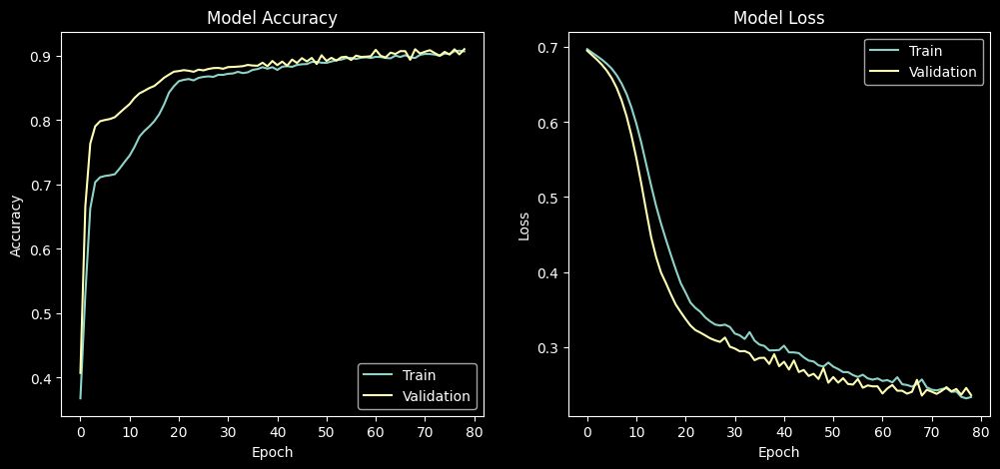

In [90]:

image_size = (128, 128, 12)


model = unet(sz=image_size)


model.summary()


from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define early stopping and model checkpoint callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with callbacks
history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping]
)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")



plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])

plt.show()


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 458ms/step
(62, 128, 128, 1)


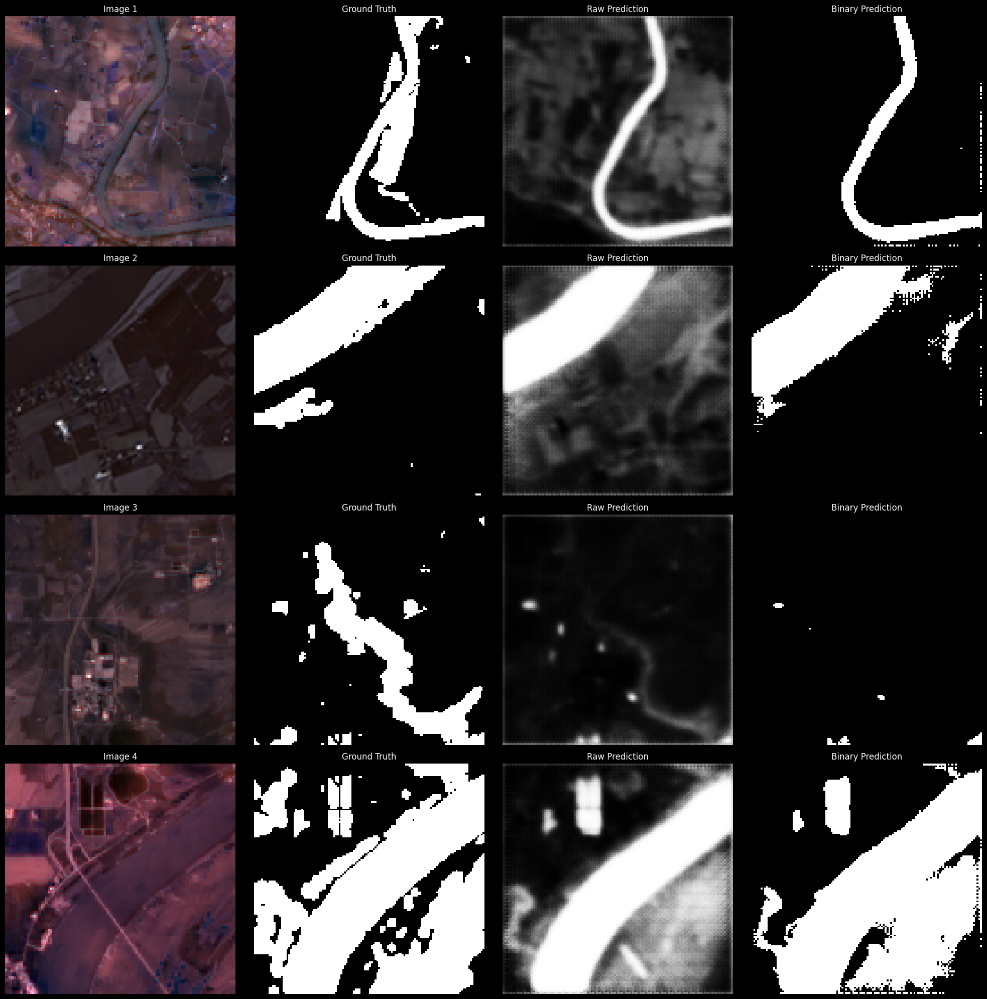

In [91]:
import numpy as np
import matplotlib.pyplot as plt

def display_predictions(images, ground_truths, predictions, y_pred_binary, num_images=6):
    # Adjust figure size based on the number of images
    plt.figure(figsize=(20, 5 * num_images))
    
    for i in range(num_images):
        # Display original RGB image
        plt.subplot(num_images, 4, 4 * i + 1)
        img = images[i]
        
        # Extract RGB bands
        red_band = img[:, :, 0]  # Band 0 - Red
        green_band = img[:, :, 1]  # Band 1 - Green
        blue_band = img[:, :, 2]  # Band 2 - Blue
        
        # Create RGB composite
        rgb_composite = np.stack([red_band, green_band, blue_band], axis=-1)
        
        plt.imshow(rgb_composite)
        plt.title(f'Image {i + 1}')
        plt.axis('off')
    
        # Display ground truth
        plt.subplot(num_images, 4, 4 * i + 2)
        plt.imshow(ground_truths[i].squeeze(), cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        # Display raw prediction
        plt.subplot(num_images, 4, 4 * i + 3)
        plt.imshow(predictions[i].squeeze(), cmap='gray')
        plt.title('Raw Prediction')
        plt.axis('off')

        # Display binary prediction
        plt.subplot(num_images, 4, 4 * i + 4)
        plt.imshow(y_pred_binary[i].squeeze(), cmap='gray')
        plt.title('Binary Prediction')
        plt.axis('off')

    plt.tight_layout()
    plt.show()
predictions = model.predict(X_test)
print(predictions.shape)
# Convert predictions to binary
y_pred_binary = (predictions > 0.5).astype(np.uint8)

# Call the function with some samples
display_predictions(X_test, y_test, predictions, y_pred_binary, num_images=4)


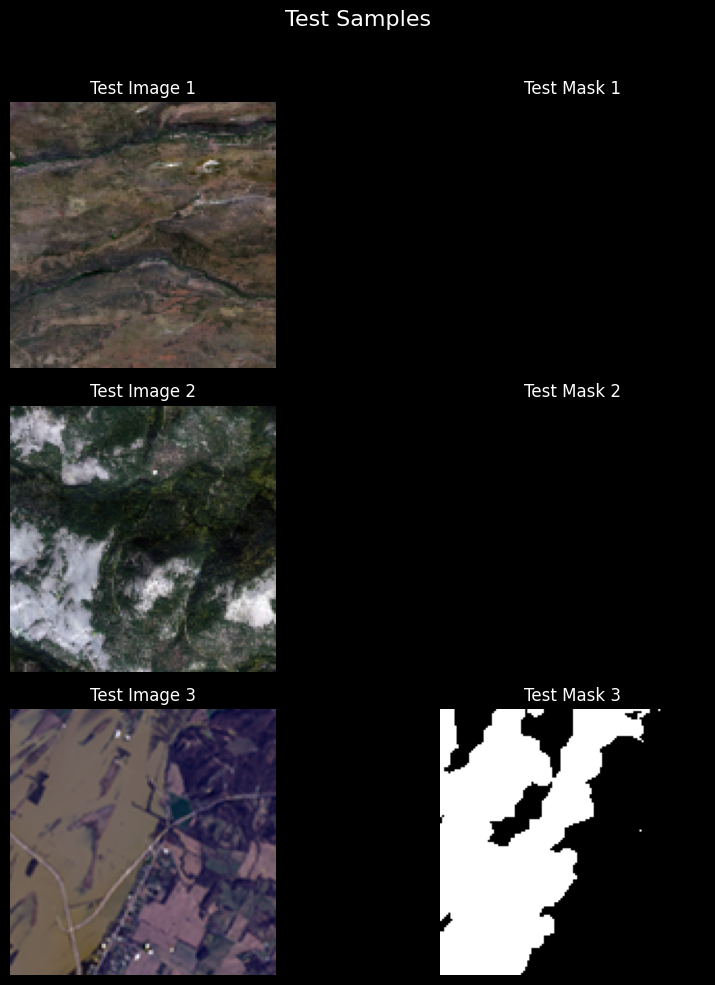

In [92]:
plot_samples(X_test, y_test, 'Test')


# **_Evaluting the model using some accurcies_**

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
Predictions shape: (62, 128, 128, 1)
Ground truth shape: (62, 128, 128)
F1 Score (weighted): 0.9204
Precision (weighted): 0.9201
Recall (weighted): 0.9217


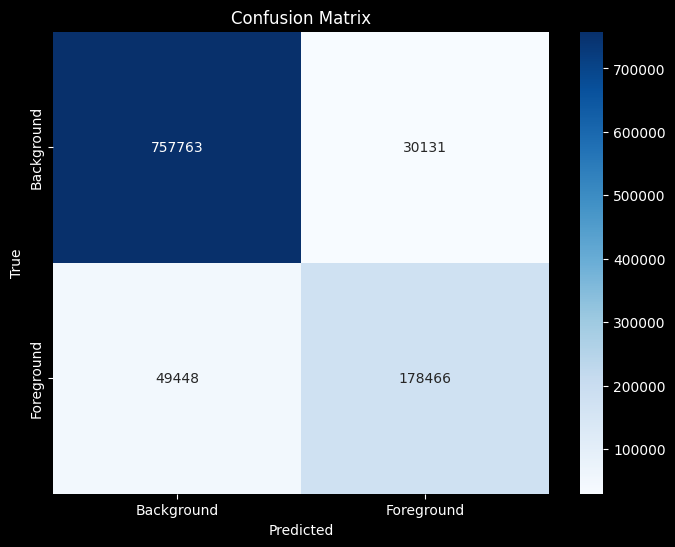

IoU Score: 0.6916


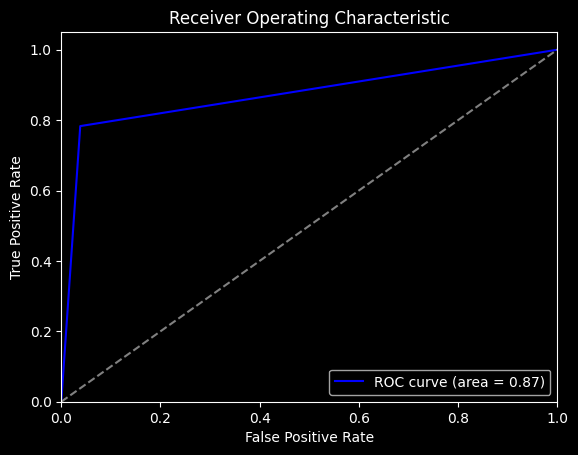

AUC: 0.8724
Dice Coefficient: 0.8177
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.9261 - loss: 0.1946
Test Loss: 0.2001
Test Accuracy: 0.9217


In [93]:
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix, roc_curve, roc_auc_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Make predictions
y_pred = model.predict(X_test)
print("Predictions shape:", y_pred.shape)
print("Ground truth shape:", y_test.shape)

# Convert predictions to binary
y_pred_binary = (y_pred > 0.5).astype(np.uint8)

# Flatten arrays for metric calculation
y_test_flat = y_test.flatten()
y_pred_flat = y_pred_binary.flatten()

# Compute metrics for binary classification
f1 = f1_score(y_test_flat, y_pred_flat, average='weighted')
precision = precision_score(y_test_flat, y_pred_flat, average='weighted')
recall = recall_score(y_test_flat, y_pred_flat, average='weighted')

print(f"F1 Score (weighted): {f1:.4f}")
print(f"Precision (weighted): {precision:.4f}")
print(f"Recall (weighted): {recall:.4f}")

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test_flat, y_pred_flat)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Background', 'Foreground'], 
            yticklabels=['Background', 'Foreground'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Compute IoU Score
def compute_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    return np.sum(intersection) / np.sum(union)

iou_score = compute_iou(y_test_flat, y_pred_flat)
print(f"IoU Score: {iou_score:.4f}")

# Compute ROC Curve and AUC
fpr, tpr, _ = roc_curve(y_test_flat, y_pred_flat)
auc = roc_auc_score(y_test_flat, y_pred_flat)

plt.figure()
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f"AUC: {auc:.4f}")

# Compute Dice Coefficient
def compute_dice(y_true, y_pred):
    intersection = np.sum(y_true * y_pred)
    return 2. * intersection / (np.sum(y_true) + np.sum(y_pred))

dice_score = compute_dice(y_test_flat, y_pred_flat)
print(f"Dice Coefficient: {dice_score:.4f}")

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")


**_Trying to increasing epochs_**

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_246 (Conv2D) │ (None, 128, 128,  │        872 │ input_layer_10[0… │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_247 (Conv2D) │ (None, 128, 128,  │        584 │ conv2d_246[0][0]  │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_54    │ (None, 64, 64, 8) │          0 │ conv2d_247[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_248 (Conv2D) │ (None, 64, 64,    │      1,168 │ max_pooling2d_54… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_249 (Conv2D) │ (None, 64, 64,    │      2,320 │ conv2d_248[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_55    │ (None, 32, 32,    │          0 │ conv2d_249[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_250 (Conv2D) │ (None, 32, 32,    │      4,640 │ max_pooling2d_55… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_251 (Conv2D) │ (None, 32, 32,    │      9,248 │ conv2d_250[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_56    │ (None, 16, 16,    │          0 │ conv2d_251[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_252 (Conv2D) │ (None, 16, 16,    │     18,496 │ max_pooling2d_56… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_253 (Conv2D) │ (None, 16, 16,    │     36,928 │ conv2d_252[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_57    │ (None, 8, 8, 64)  │          0 │ conv2d_253[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_254 (Conv2D) │ (None, 8, 8, 128) │     73,856 │ max_pooling2d_57… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_255 (Conv2D) │ (None, 8, 8, 128) │    147,584 │ conv2d_254[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_58    │ (None, 4, 4, 128) │          0 │ conv2d_255[0][0]  │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_256 (Conv2D) │ (None, 4, 4, 256) │    295,168 │ max_pooling2d_58… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_257 (Conv2D) │ (None, 4, 4, 256) │    590,080 │ conv2d_256[0][0]

 Total params: 6,668,287 (25.44 MB)

 Trainable params: 6,668,287 (25.44 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 505ms/step - accuracy: 0.3217 - loss: 0.7674 - val_accuracy: 0.2046 - val_loss: 0.7847 - learning_rate: 1.0000e-04
Epoch 2/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 477ms/step - accuracy: 0.2945 - loss: 0.7551 - val_accuracy: 0.2062 - val_loss: 0.7609 - learning_rate: 1.0000e-04
Epoch 3/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 472ms/step - accuracy: 0.3107 - loss: 0.7340 - val_accuracy: 0.2079 - val_loss: 0.7414 - learning_rate: 1.0000e-04
Epoch 4/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 448ms/step - accuracy: 0.3182 - loss: 0.7195 - val_accuracy: 0.2116 - val_loss: 0.7254 - learning_rate: 1.0000e-04
Epoch 5/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 451ms/step - accuracy: 0.3152 - loss: 0.7101 - val_accuracy: 0.2332 - val_loss: 0.7126 - learning_rate: 1.0000e-04
Epoch 6/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 452ms/step - accuracy: 0.3187 - loss: 0.7029 - val_accuracy: 0.3223 - val_loss: 0.7024 - learning_rate: 1.0000e-04
Epoch 7/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 442ms/step - accuracy: 0.4052

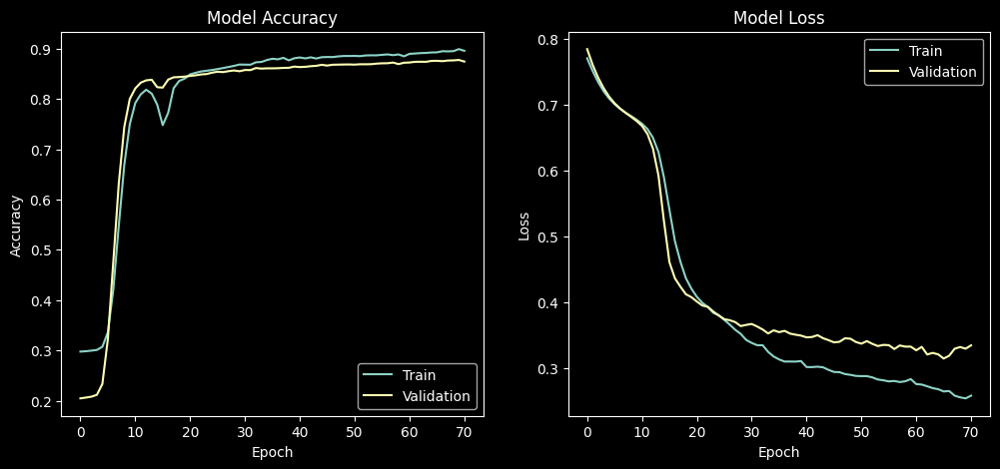

In [98]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
image_size = (128, 128, 12)


model2 = unet(sz=image_size)
model2.summary()

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6
)

history2 = model2.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping,reduce_lr]
)


loss, accuracy = model2.evaluate(X_test, y_test, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")



plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history2.history['accuracy'])
plt.plot(history2.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])

plt.show()


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step
Predictions shape: (62, 128, 128, 1)
Ground truth shape: (62, 128, 128)
F1 Score (weighted): 0.9096
Precision (weighted): 0.9103
Recall (weighted): 0.9124


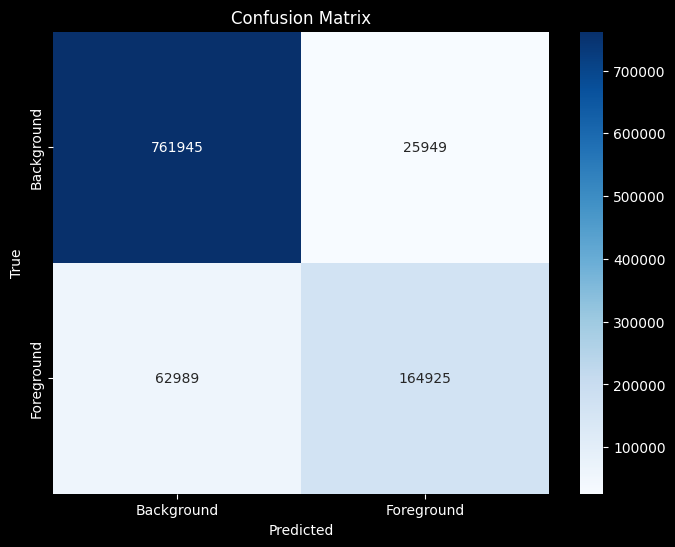

IoU Score: 0.6497


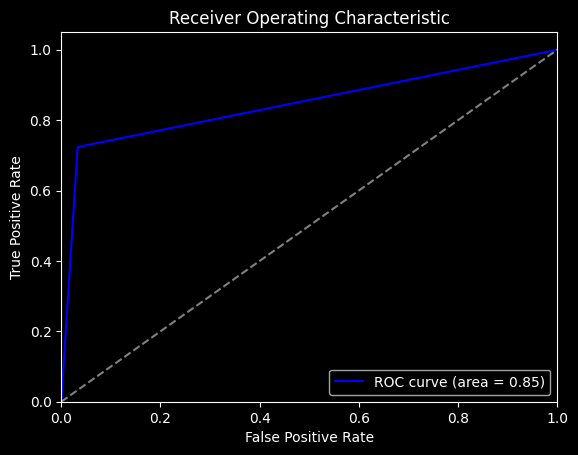

AUC: 0.8453
Dice Coefficient: 0.7876
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9154 - loss: 0.2166
Test Loss: 0.2224
Test Accuracy: 0.9124


In [99]:
def evalutee(model):
    y_pred = model.predict(X_test)
    print("Predictions shape:", y_pred.shape)
    print("Ground truth shape:", y_test.shape)

    # Convert predictions to binary
    y_pred_binary = (y_pred > 0.5).astype(np.uint8)

    # Flatten arrays for metric calculation
    y_test_flat = y_test.flatten()
    y_pred_flat = y_pred_binary.flatten()

    # Compute metrics for binary classification
    f1 = f1_score(y_test_flat, y_pred_flat, average='weighted')
    precision = precision_score(y_test_flat, y_pred_flat, average='weighted')
    recall = recall_score(y_test_flat, y_pred_flat, average='weighted')

    print(f"F1 Score (weighted): {f1:.4f}")
    print(f"Precision (weighted): {precision:.4f}")
    print(f"Recall (weighted): {recall:.4f}")

    # Calculate the confusion matrix
    conf_matrix = confusion_matrix(y_test_flat, y_pred_flat)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Background', 'Foreground'], 
                yticklabels=['Background', 'Foreground'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    # Compute IoU Score
    def compute_iou(y_true, y_pred):
        intersection = np.logical_and(y_true, y_pred)
        union = np.logical_or(y_true, y_pred)
        return np.sum(intersection) / np.sum(union)

    iou_score = compute_iou(y_test_flat, y_pred_flat)
    print(f"IoU Score: {iou_score:.4f}")

    # Compute ROC Curve and AUC
    fpr, tpr, _ = roc_curve(y_test_flat, y_pred_flat)
    auc = roc_auc_score(y_test_flat, y_pred_flat)

    plt.figure()
    plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % auc)
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    print(f"AUC: {auc:.4f}")

    # Compute Dice Coefficient
    def compute_dice(y_true, y_pred):
        intersection = np.sum(y_true * y_pred)
        return 2. * intersection / (np.sum(y_true) + np.sum(y_pred))

    dice_score = compute_dice(y_test_flat, y_pred_flat)
    print(f"Dice Coefficient: {dice_score:.4f}")

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}")
evalutee(model2)    

    

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Predictions shape: (62, 128, 128, 1)


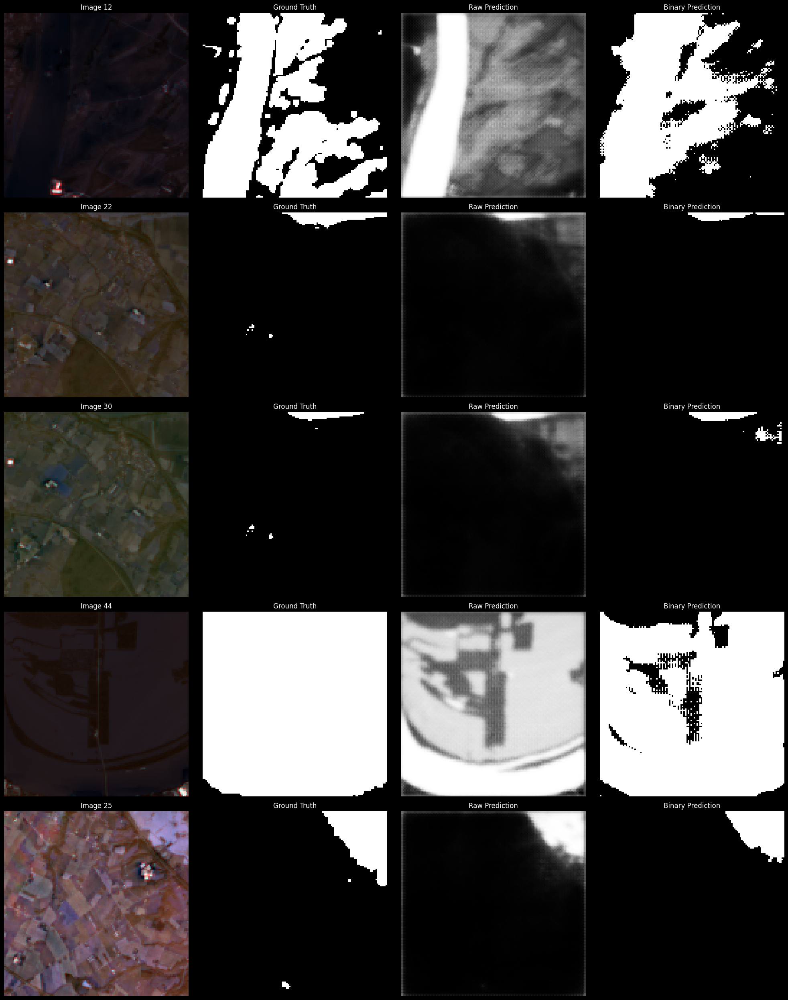

In [100]:
def display_predictions(images, ground_truths, predictions, y_pred_binary, num_images=6):
    # Ensure num_images does not exceed the available number of images
    num_images = min(num_images, len(images))
    
    # Select random indices
    indices = np.random.choice(len(images), num_images, replace=False)
    
    # Adjust figure size based on the number of images
    plt.figure(figsize=(20, 5 * num_images))
    
    for i, idx in enumerate(indices):
        # Display original RGB image
        plt.subplot(num_images, 4, 4 * i + 1)
        img = images[idx]
        
        # Extract RGB bands
        red_band = img[:, :, 0]  # Band 0 - Red
        green_band = img[:, :, 1]  # Band 1 - Green
        blue_band = img[:, :, 2]  # Band 2 - Blue
        
        # Create RGB composite
        rgb_composite = np.stack([red_band, green_band, blue_band], axis=-1)
        
        plt.imshow(rgb_composite)
        plt.title(f'Image {idx + 1}')
        plt.axis('off')
    
        # Display ground truth
        plt.subplot(num_images, 4, 4 * i + 2)
        plt.imshow(ground_truths[idx].squeeze(), cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        # Display raw prediction
        plt.subplot(num_images, 4, 4 * i + 3)
        plt.imshow(predictions[idx].squeeze(), cmap='gray')
        plt.title('Raw Prediction')
        plt.axis('off')

        # Display binary prediction
        plt.subplot(num_images, 4, 4 * i + 4)
        plt.imshow(y_pred_binary[idx].squeeze(), cmap='gray')
        plt.title('Binary Prediction')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


predictions = model2.predict(X_test)
print("Predictions shape:", predictions.shape)

y_pred_binary = (predictions > 0.5).astype(np.uint8)

display_predictions(X_test, y_test, predictions, y_pred_binary, num_images=5)

*-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

**_Third Normalization(Mentor Advice)_**

Epoch 1/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 474ms/step - accuracy: 0.7050 - loss: 4.7473 - val_accuracy: 0.7966 - val_loss: 3.2754 - learning_rate: 1.0000e-04
Epoch 2/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 403ms/step - accuracy: 0.6890 - loss: 4.9692 - val_accuracy: 0.7964 - val_loss: 3.2693 - learning_rate: 1.0000e-04
Epoch 3/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 418ms/step - accuracy: 0.7001 - loss: 4.7506 - val_accuracy: 0.8008 - val_loss: 3.0407 - learning_rate: 1.0000e-04
Epoch 4/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 439ms/step - accuracy: 0.7454 - loss: 3.7608 - val_accuracy: 0.8183 - val_loss: 2.8549 - learning_rate: 1.0000e-04
Epoch 5/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 436ms/step - accuracy: 0.7786 - loss: 3.3446 - val_accuracy: 0.8253 - val_loss: 2.6663 - learning_rate: 1.0000e-04
Epoch 6/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 429ms/step - accuracy: 0.8035 - loss: 2.9236 - val_accuracy: 0.8292 - val_loss: 2.5778 - learning_rate: 1.0000e-04
Epoch 7/500
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 421ms/step - accuracy: 0.7979 

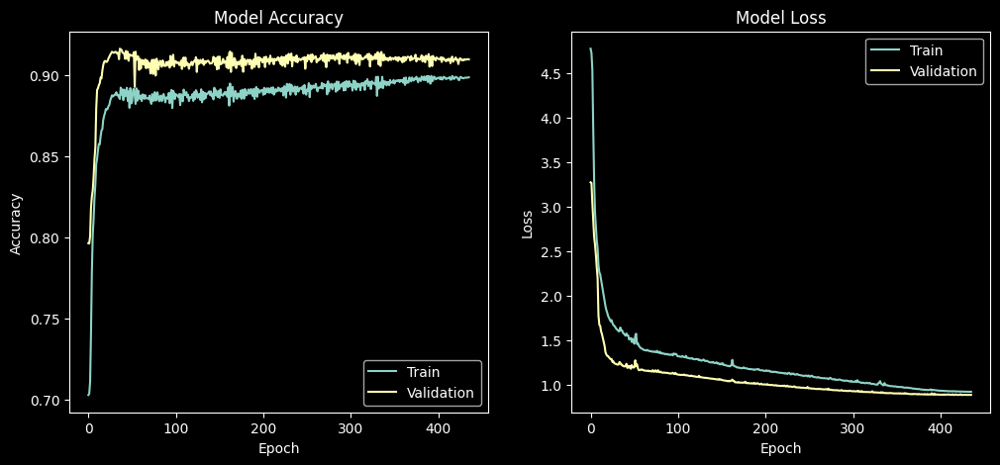

In [56]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
image_size = (128, 128, 12)
model3 = unet(sz=image_size)


early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=20,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6
)


history3 = model3.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping,reduce_lr]
)


loss, accuracy = model3.evaluate(X_test, y_test, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")



plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history3.history['accuracy'])
plt.plot(history3.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history3.history['loss'])
plt.plot(history3.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])

plt.show()


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 473ms/step
Predictions shape: (62, 128, 128, 1)
Ground truth shape: (62, 128, 128)
F1 Score (weighted): 0.9107
Precision (weighted): 0.9102
Recall (weighted): 0.9117


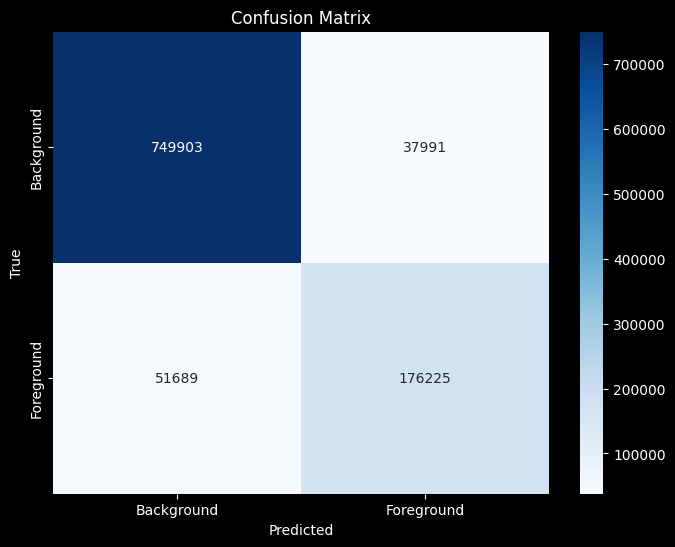

IoU Score: 0.6627


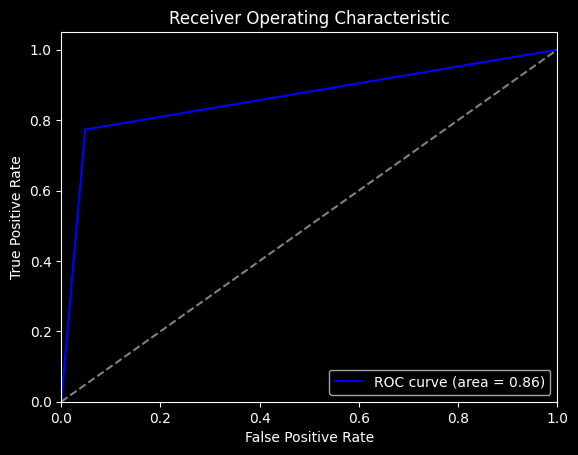

AUC: 0.8625
Dice Coefficient: 0.7972
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.9135 - loss: 0.8326
Test Loss: 0.8445
Test Accuracy: 0.9117


In [57]:
evalutee(model3)